In [3]:

import os, glob
from PIL import Image
from skimage.measure import label, regionprops
from skimage.color import label2rgb
from skimage import morphology
# Imports
from spectral import *
import matplotlib.pyplot as plt
import numpy as np
import cv2
import skimage as ski

import os
import re
from spectral import envi
import sklearn
from collections import defaultdict


In [ ]:


# --- configuration ---
CUBE_DIR = r"D:\hyperspectral\SWIR\white_minmax_npy"
MASK_DIR = r"D:\hyperspectral\Nora\predictions_hsi_new"

AUTO_RESIZE_MASK = True
FILL_VALUE = 0.0  # or np.nan

exp_pattern = re.compile(r'(exp\d+)', re.IGNORECASE)

def ensure_hwb(arr):
    if arr.ndim != 3:
        raise ValueError(f"HSI cube must be 3D, got {arr.shape}")
    if arr.shape[0] < 16 and arr.shape[1] > 32:
        return np.transpose(arr, (1, 2, 0))
    return arr

def load_and_prepare_mask(mask_path, hw):
    m = np.load(mask_path)
    if m.ndim == 3:
        m = m[..., 0]
    H, W = hw
    if m.shape != (H, W):
        m = np.array(Image.fromarray(m.astype(np.uint8)).resize((W, H), Image.NEAREST))
    return (m > 0.5).astype(np.uint8)

def apply_mask(cube, mask, fill_value=0.0):
    out = cube.copy()
    if np.isnan(fill_value):
        out[mask == 0] = np.nan
    else:
        out *= mask[..., None]
    return out

# --- build mask index ---
mask_index = {}
for mp in glob.glob(os.path.join(MASK_DIR, "*")):
    if not mp.lower().endswith(".npy"):
        print(f"[skip] Not an .npy file: {mp}")
        continue

    base = os.path.splitext(os.path.basename(mp))[0]
    if base.endswith("_plantmask"):
        base = base[:-len("_plantmask")]
    mask_index[base] = mp


# --- build dict ---
masked_dict = {}

for cp in glob.glob(os.path.join(CUBE_DIR, "*.npy")):
    base = os.path.splitext(os.path.basename(cp))[0]
    mp = mask_index.get(base)
    if mp is None:
        print(f"[warn] no mask for {base}")
        continue

    # extract *all* experiments (e.g. ['exp3', 'exp4'])
    exps = exp_pattern.findall(base)
    if not exps:
        exps = ["unknown"]

    cube = ensure_hwb(np.load(cp).astype(np.float32))
    H, W, B = cube.shape
    mask = load_and_prepare_mask(mp, (H, W))
    masked = apply_mask(cube, mask, fill_value=FILL_VALUE)
    
    for exp in exps:
        masked_dict.setdefault(exp, {})[base] = masked
        print(f"[ok] stored {base} in {exp} (shape={masked.shape})")

print("\nSummary:")
for exp, group in masked_dict.items():
    print(f"  {exp}: {len(group)} cubes")


[skip] Not an .npy file: D:\hyperspectral\Nora\predictions_hsi_new\exp2_21_03_clean_kontroll_sample1_SWIR_mask_color.png
[skip] Not an .npy file: D:\hyperspectral\Nora\predictions_hsi_new\exp2_21_03_clean_kontroll_sample1_SWIR_overlay.png
[skip] Not an .npy file: D:\hyperspectral\Nora\predictions_hsi_new\exp2_21_03_clean_kontroll_sample2_SWIR_mask_color.png
[skip] Not an .npy file: D:\hyperspectral\Nora\predictions_hsi_new\exp2_21_03_clean_kontroll_sample2_SWIR_overlay.png
[skip] Not an .npy file: D:\hyperspectral\Nora\predictions_hsi_new\exp2_21_03_clean_tork_sample1_SWIR_mask_color.png
[skip] Not an .npy file: D:\hyperspectral\Nora\predictions_hsi_new\exp2_21_03_clean_tork_sample1_SWIR_overlay.png
[skip] Not an .npy file: D:\hyperspectral\Nora\predictions_hsi_new\exp2_21_03_clean_tork_sample2_SWIR_mask_color.png
[skip] Not an .npy file: D:\hyperspectral\Nora\predictions_hsi_new\exp2_21_03_clean_tork_sample2_SWIR_overlay.png
[skip] Not an .npy file: D:\hyperspectral\Nora\predictions_h

In [33]:
masked_dict["pilot"] = masked_dict.pop("unknown")

In [34]:
# Remove all keys from masked_dict["exp3"] that start with "exp4"
if "exp3" in masked_dict:
    before = len(masked_dict["exp3"])
    masked_dict["exp3"] = {
        k: v for k, v in masked_dict["exp3"].items()
        if not k.startswith("exp4")
    }
    after = len(masked_dict["exp3"])
    print(f"Removed {before - after} keys from exp3.")
else:
    print("exp3 not found in masked_dict.")


Removed 16 keys from exp3.


## Visualization

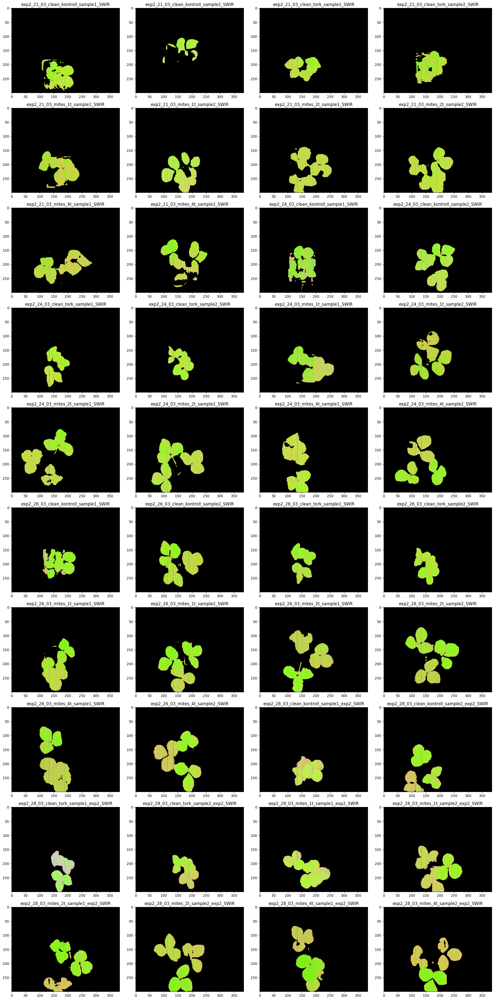

In [9]:
fig, axes = plt.subplots(10, 4, figsize=(20,40))
axes = axes.flatten()
ix = 0

for key, val in masked_dict["exp2"].items():
    rgb_im = get_rgb(val)
    axes[ix].imshow(rgb_im)
    axes[ix].set_title(f'{key}')
    ix += 1
    #axes[ix].axis('off')

plt.tight_layout()
plt.show()

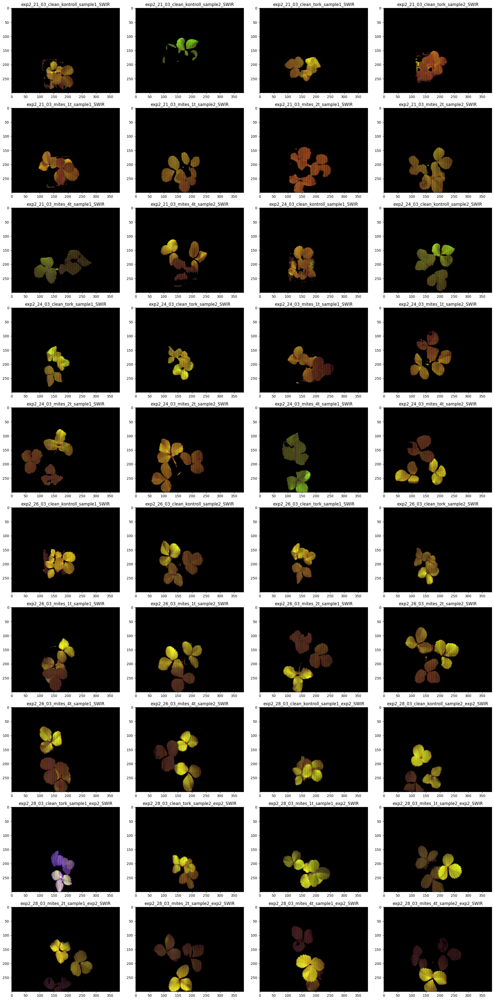

In [34]:
fig, axes = plt.subplots(10, 4, figsize=(20,40))
axes = axes.flatten()
ix = 0

for key, val in masked_dict["exp2"].items():
    rgb_im = get_rgb(val)
    axes[ix].imshow(rgb_im)
    axes[ix].set_title(f'{key}')
    ix += 1
    #axes[ix].axis('off')

plt.tight_layout()
plt.show()

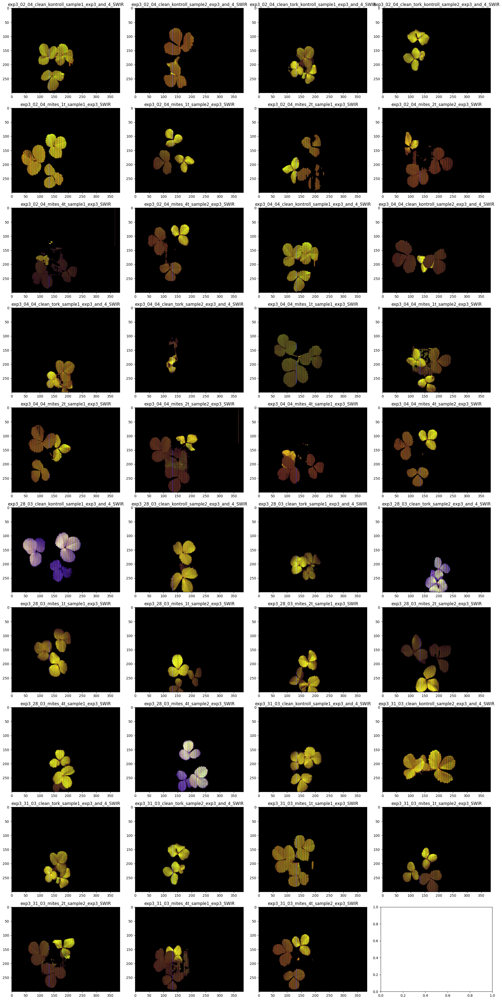

In [39]:
fig, axes = plt.subplots(10, 4, figsize=(20,40))
axes = axes.flatten()
ix = 0

for key, val in masked_dict["exp3"].items():
    rgb_im = get_rgb(val)
    axes[ix].imshow(rgb_im)
    axes[ix].set_title(f'{key}')
    ix += 1
    #axes[ix].axis('off')

plt.tight_layout()
plt.show()

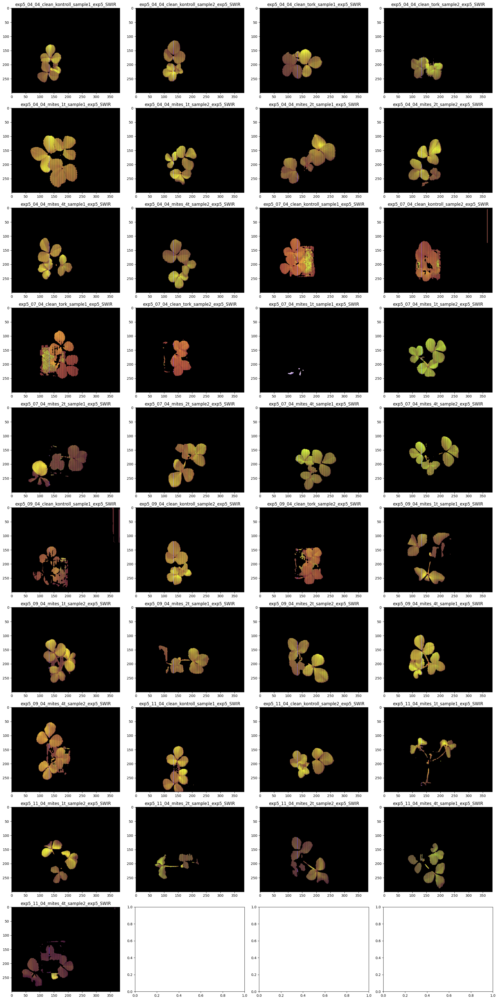

In [7]:
fig, axes = plt.subplots(10, 4, figsize=(20,40))
axes = axes.flatten()
ix = 0

for key, val in masked_dict["exp5"].items():
    rgb_im = get_rgb(val)
    axes[ix].imshow(rgb_im)
    axes[ix].set_title(f'{key}')
    ix += 1
    #axes[ix].axis('off')

plt.tight_layout()
plt.show()

## Spectrum Analysis


In [7]:

def snv(spectrum):
    """Apply Standard Normal Variate (SNV) correction to a single spectrum."""
    spectrum = np.asarray(spectrum, dtype=float)
    mean = np.mean(spectrum)
    std = np.std(spectrum)
    return (spectrum - mean) / std


In [35]:



import numpy as np

def average_spectrum(cube: np.ndarray) -> np.ndarray:
    """
    Compute the mean spectrum for all non-zero pixels in a hyperspectral image cube.

    Args:
        cube (np.ndarray): Hyperspectral image of shape (H, W, B)

    Returns:
        np.ndarray: Mean spectrum of shape (B,)
    """
    if not isinstance(cube, np.ndarray):
        raise TypeError("Input must be a numpy array.")
    if cube.ndim != 3:
        raise ValueError(f"Expected 3D array (H, W, B), got shape {cube.shape}")

    # Reshape spatial dimensions
    H, W, B = cube.shape
    pixels = cube.reshape(-1, B)

    # Keep only non-zero pixels (any band > 0)
    nonzero_mask = np.any(pixels != 0, axis=1)
    nonzero_pixels = pixels[nonzero_mask]

    # Compute mean spectrum over non-zero pixels only
    mean_spectrum = nonzero_pixels.mean(axis=0)

    return mean_spectrum




def average_by_treatment(sample_dict):
    """
    Groups keys by prefix before '_sampleX' and averages spectra.

    sample_dict : {str: np.ndarray}
        Keys like "treatA_sample1", values are (B,) mean spectra.
    Returns
    -------
    treat_dict : {str: np.ndarray}
        Keys like "treatA", values are (B,) averaged spectra.
    """
    groups = defaultdict(list)
    for key, spec in sample_dict.items():
        # strip suffix like "_sample1" or "_sample2"
        base = re.sub(r'_sample\d+.*$', '', key)
        base = base.lower()
        groups[base].append(spec.astype(np.float64, copy=False))

    treat_dict = {}
    for base, specs in groups.items():
        stacked = np.vstack(specs)       # (n_samples, B)
        mean = stacked.mean(axis=0)      # (B,)
        treat_dict[base] = mean.astype(np.float32)

    return treat_dict

In [13]:
wavelenght = envi.read_envi_header(r"D:\hyperspectral\Nora\21_03\clean_kontroll_sample1_SWIR_384_SN3151_2197us_2025-03-21T131413_raw.hdr")['wavelength']
ww = [float(i) for i in wavelenght]

In [10]:
import re
from collections import defaultdict

def re_nest_by_date(masked_dict, date_pattern=r"\d{2}_\d{2}"):
    """
    Transform masked_dict[exp][f"{exp}_{date}_{rest}"] -> masked_dict[exp][date][rest].
    - exp: outer key (e.g., "exp2")
    - date: matches date_pattern (default "DD_MM", e.g., "21_03")
    - rest: whatever remains after prefix

    If the label doesn't match the expected pattern, it tries to find the first
    occurrence of date_pattern and splits there. Otherwise, it keeps the label as-is
    under date="unknown".
    """
    new_dict = {}

    for exp, inner in masked_dict.items():
        # nested defaultdict for convenience
        exp_bucket = defaultdict(dict)

        for full_label, value in inner.items():
            # Preferred: label starts with "{exp}_{date}_{rest}"
            m = re.match(rf"^{re.escape(exp)}_(?P<date>{date_pattern})_(?P<rest>.+)$", full_label)

            if m:
                date = m.group("date")
                rest = m.group("rest")
            else:
                # Fallback: find first {date}_{rest} anywhere
                m2 = re.search(rf"(?P<date>{date_pattern})_(?P<rest>.+)$", full_label)
                if m2:
                    date = m2.group("date")
                    rest = m2.group("rest")
                else:
                    # Final fallback: no recognizable date; keep label as-is
                    date = "unknown"
                    rest = full_label

            exp_bucket[date][rest] = value

        new_dict[exp] = dict(exp_bucket)  # convert back to plain dicts

    return new_dict


In [36]:
masked_dict = re_nest_by_date(masked_dict)

## Minmax normalized

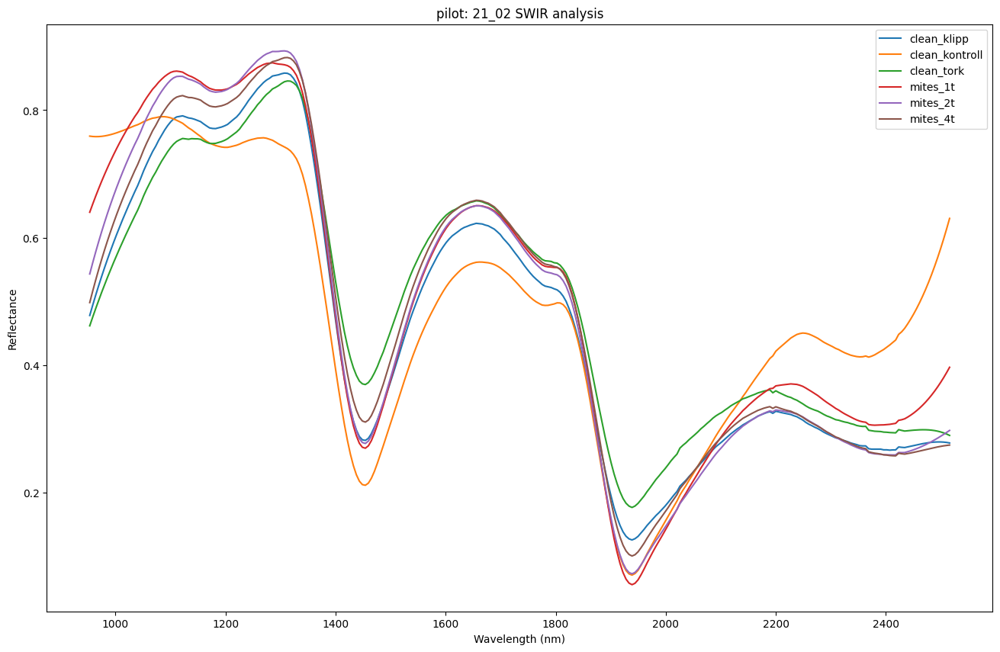

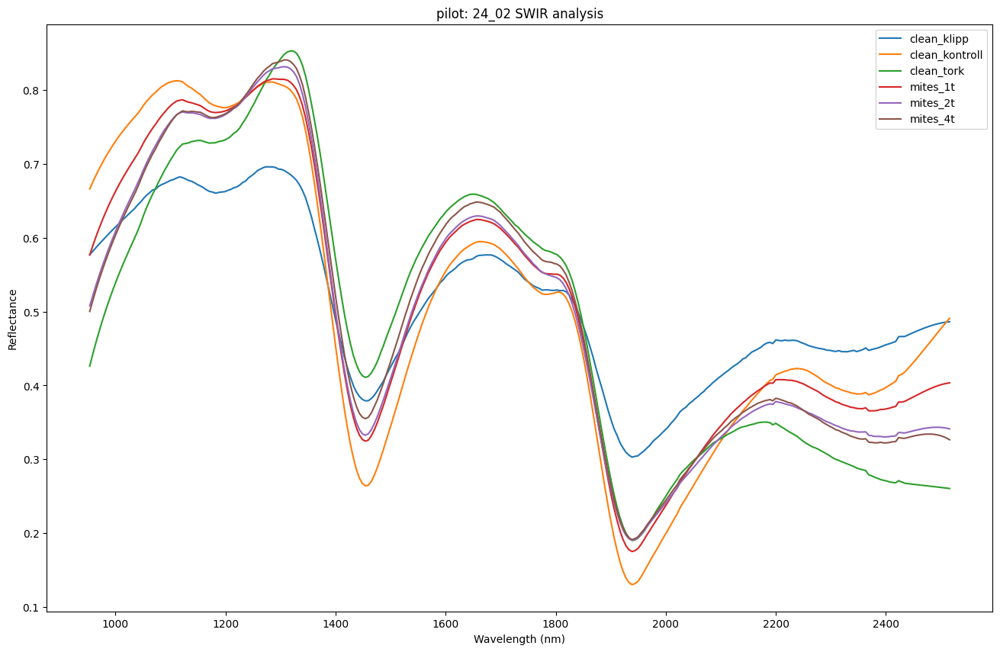

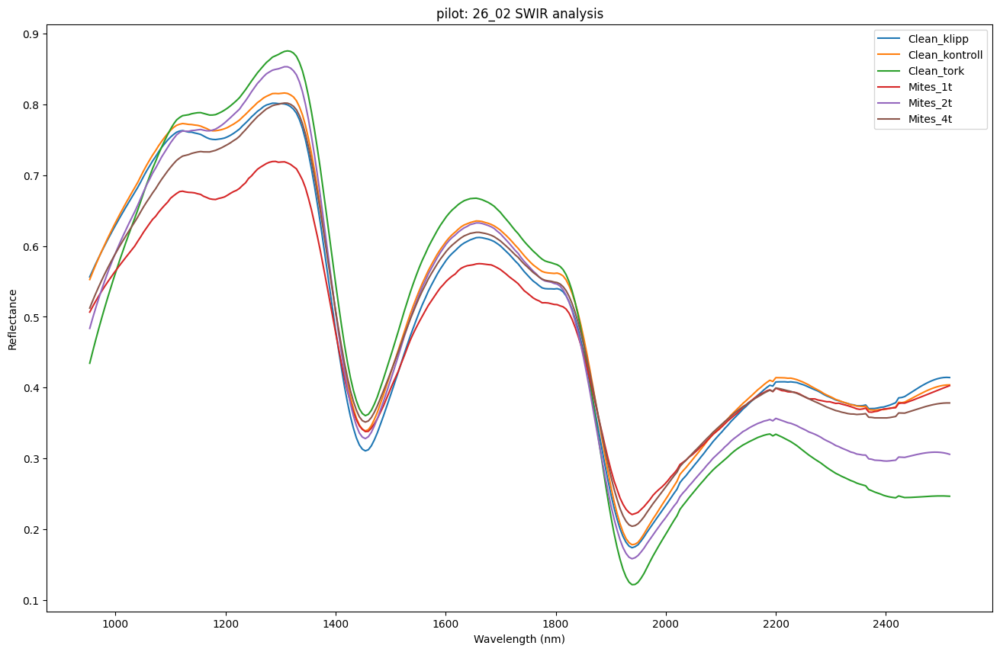

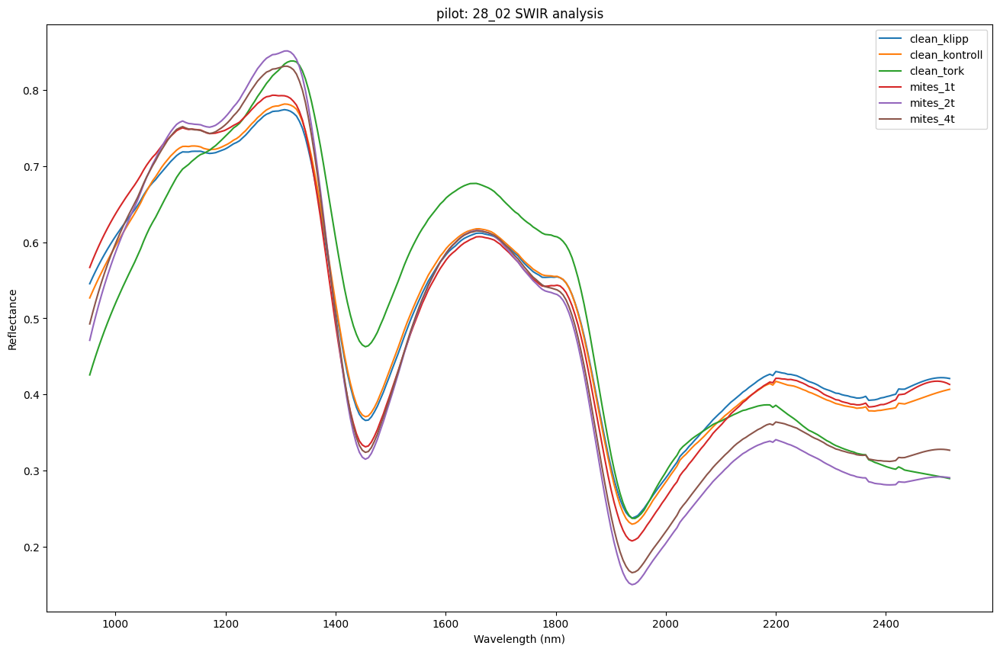

In [21]:
for date, avg in mean_spec_dict["pilot"].items():
   treat_dict = average_by_treatment(avg)
   plt.figure(figsize=(16, 10))
   for t, spec in treat_dict.items():
      # print(f"{t}: {spec.shape} (avg over {len([k for k in mean_spec_dict["310325"] if k.startswith(t)])} samples)")
      plt.plot(ww, spec, label=t)
      plt.legend()
      plt.xlabel("Wavelength (nm)")
      plt.ylabel("Reflectance")
      plt.title(f"pilot: {date} SWIR analysis")
      plt.savefig(f"plots/swir_pilot_{date}_minmax.png")

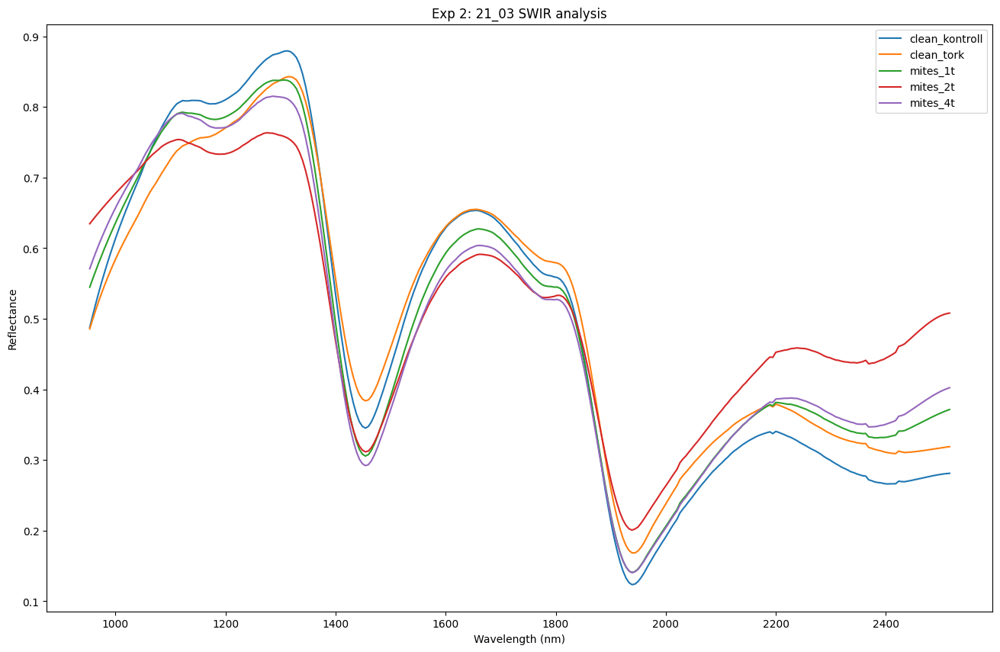

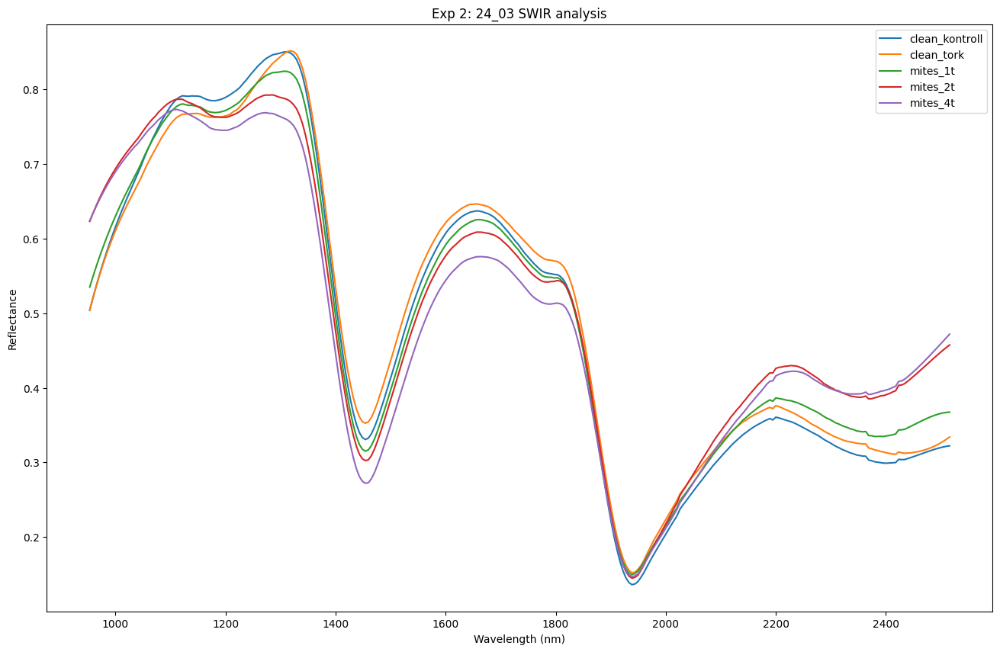

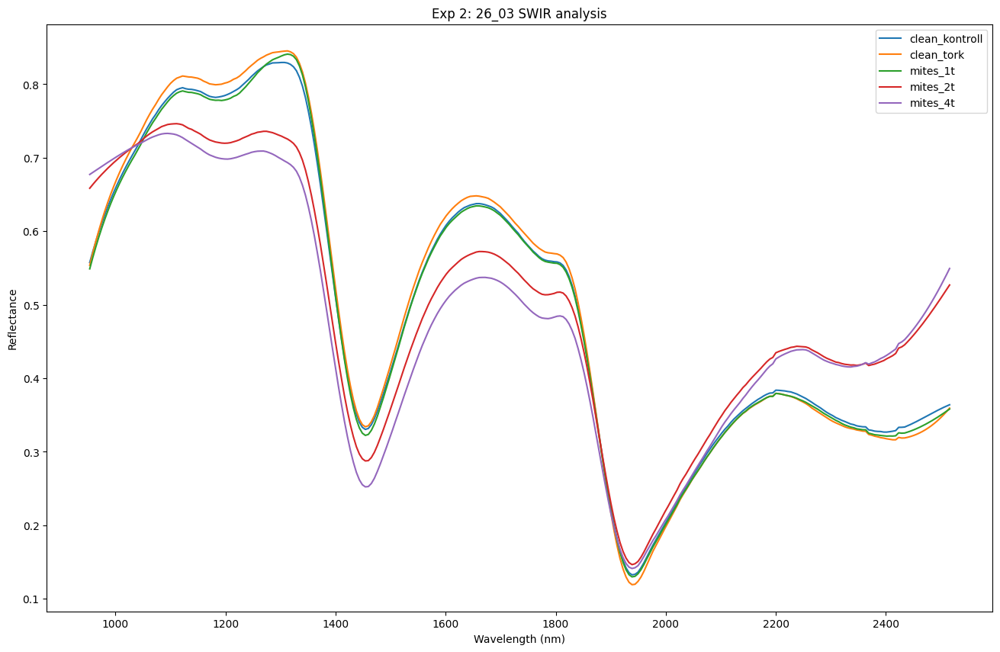

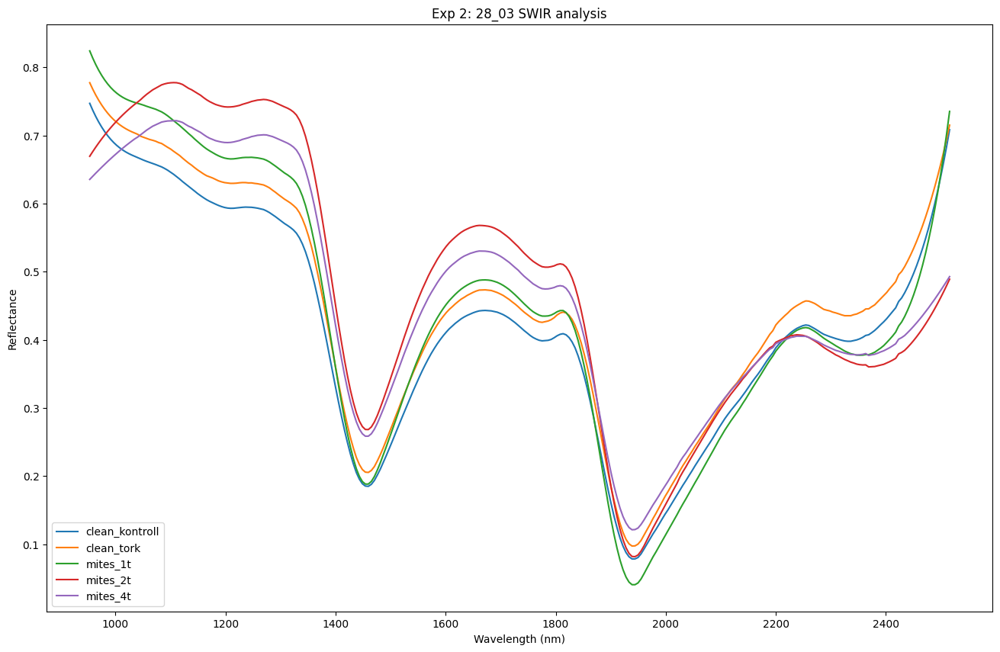

In [24]:
for date, avg in mean_spec_dict["exp2"].items():
   treat_dict = average_by_treatment(avg)
   plt.figure(figsize=(16, 10))
   for t, spec in treat_dict.items():
      # print(f"{t}: {spec.shape} (avg over {len([k for k in mean_spec_dict["310325"] if k.startswith(t)])} samples)")
      plt.plot(ww, spec, label=t)
      plt.legend()
      plt.xlabel("Wavelength (nm)")
      plt.ylabel("Reflectance")
      plt.title(f"Exp 2: {date} SWIR analysis")
      plt.savefig(f"plots/swir_exp2_{date}_minmax.png")

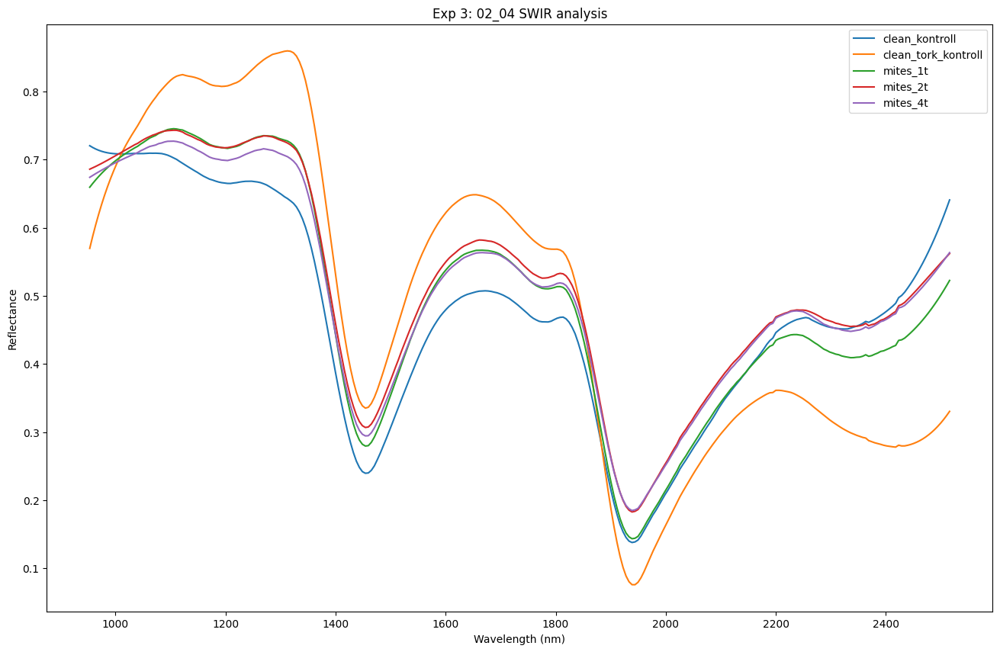

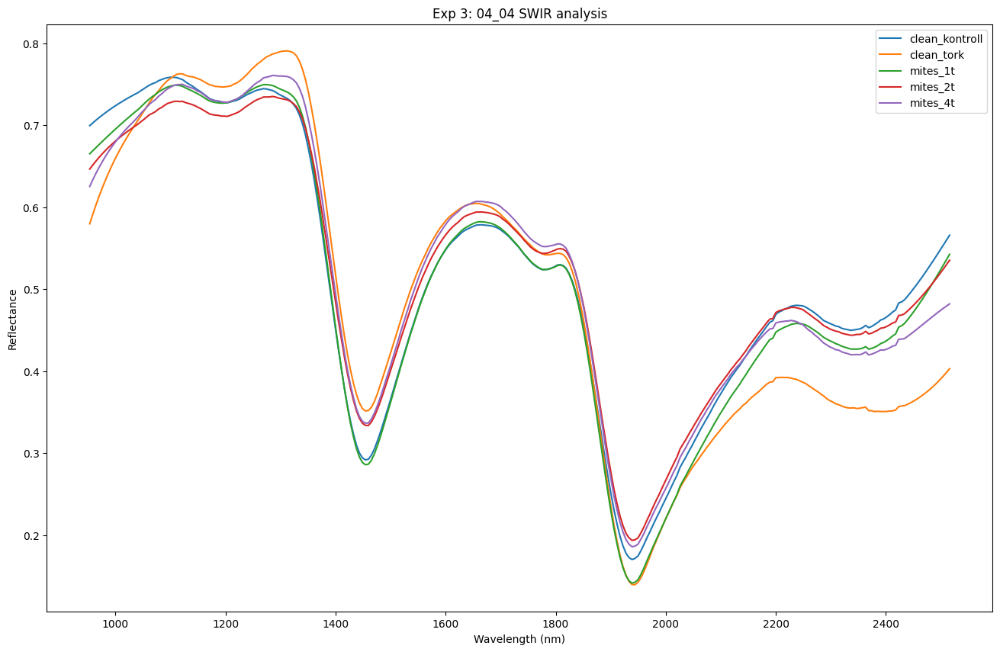

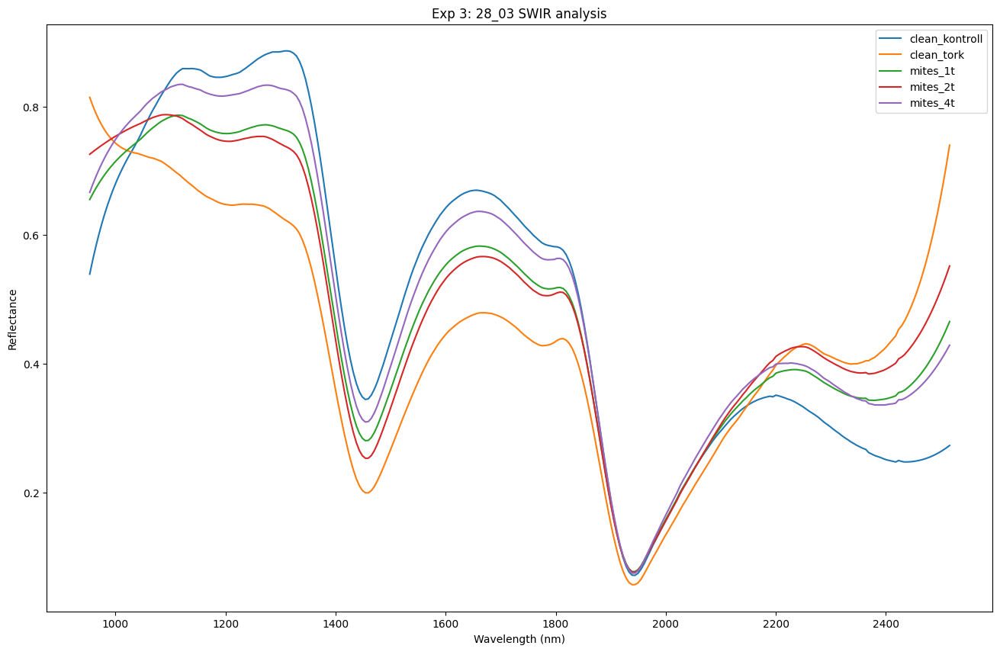

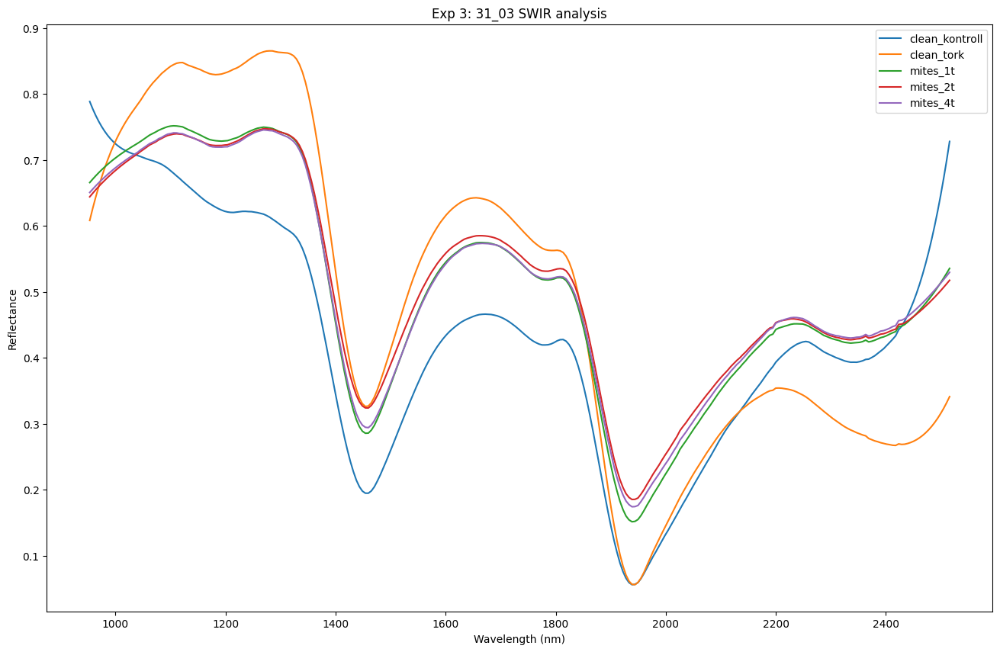

In [23]:
for date, avg in mean_spec_dict["exp3"].items():
   treat_dict = average_by_treatment(avg)
   plt.figure(figsize=(16, 10))
   for t, spec in treat_dict.items():
      # print(f"{t}: {spec.shape} (avg over {len([k for k in mean_spec_dict["310325"] if k.startswith(t)])} samples)")
      plt.plot(ww, spec, label=t)
      plt.legend()
      plt.xlabel("Wavelength (nm)")
      plt.ylabel("Reflectance")
      plt.title(f"Exp 3: {date} SWIR analysis")
      plt.savefig(f"plots/swir_exp3_{date}_minmax.png")

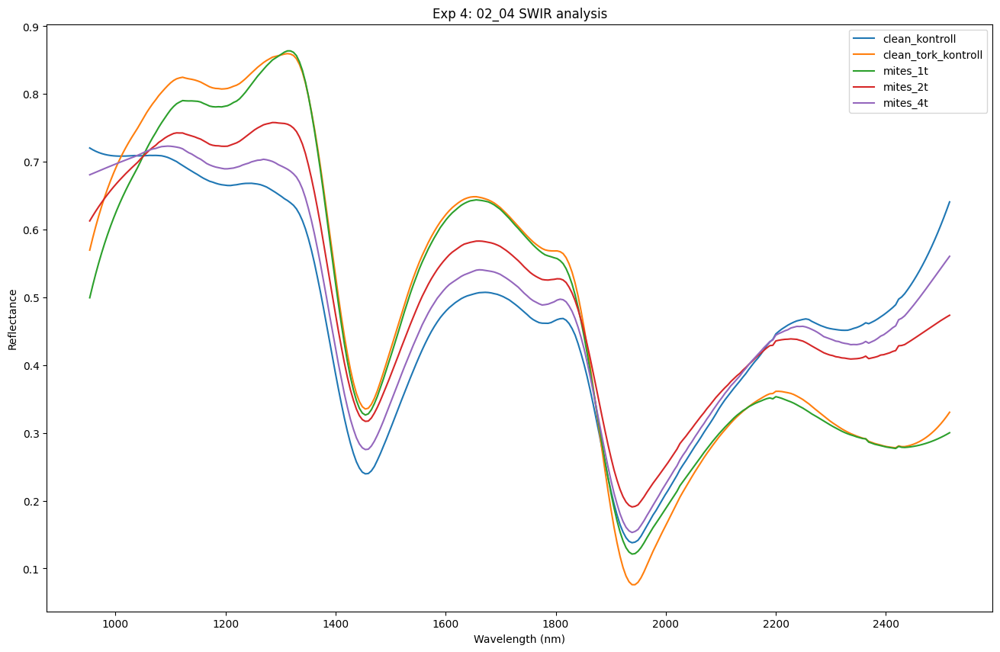

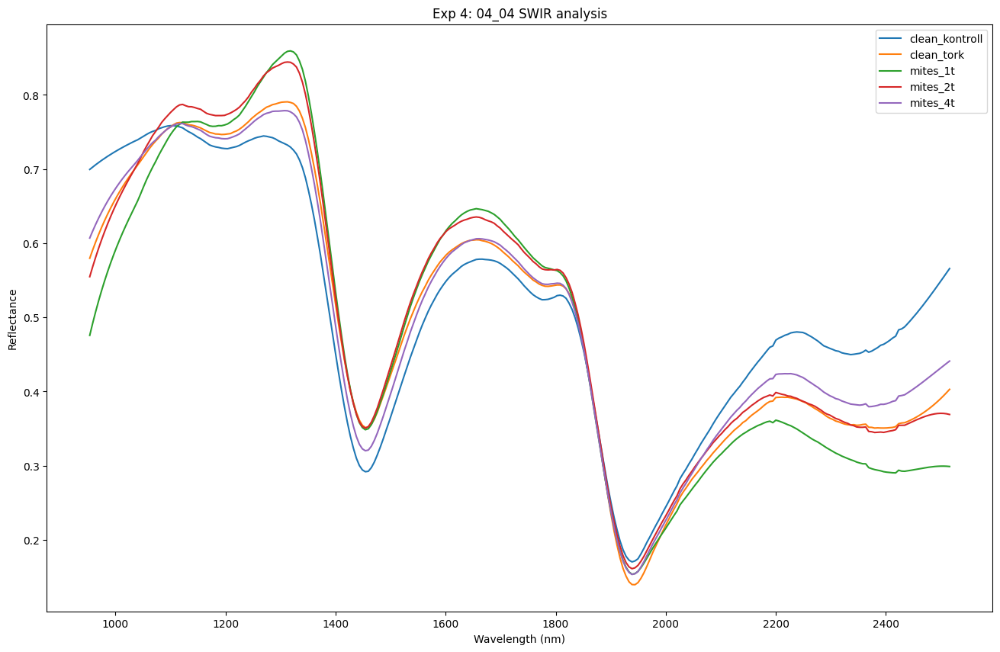

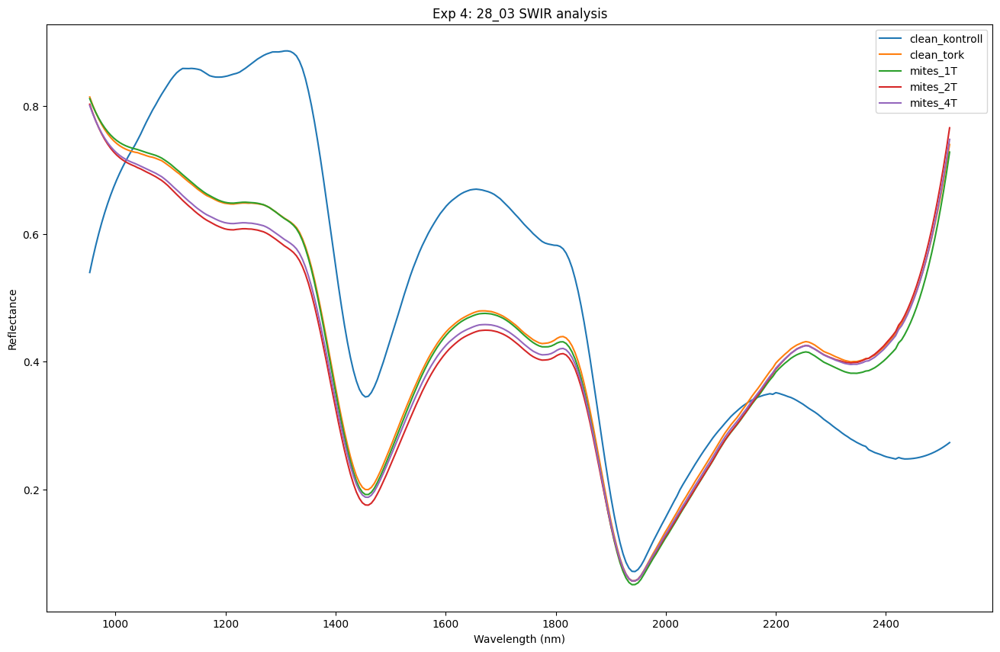

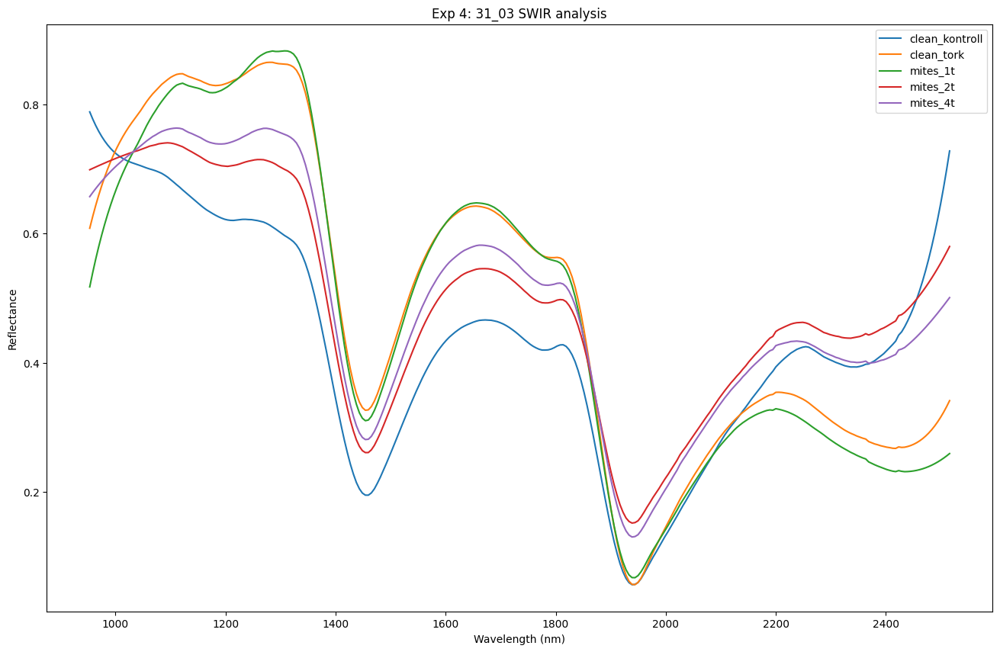

In [25]:
for date, avg in mean_spec_dict["exp4"].items():
   treat_dict = average_by_treatment(avg)
   plt.figure(figsize=(16, 10))
   for t, spec in treat_dict.items():
      # print(f"{t}: {spec.shape} (avg over {len([k for k in mean_spec_dict["310325"] if k.startswith(t)])} samples)")
      plt.plot(ww, spec, label=t)
      plt.legend()
      plt.xlabel("Wavelength (nm)")
      plt.ylabel("Reflectance")
      plt.title(f"Exp 4: {date} SWIR analysis")
      plt.savefig(f"plots/swir_exp4_{date}_minmax.png")

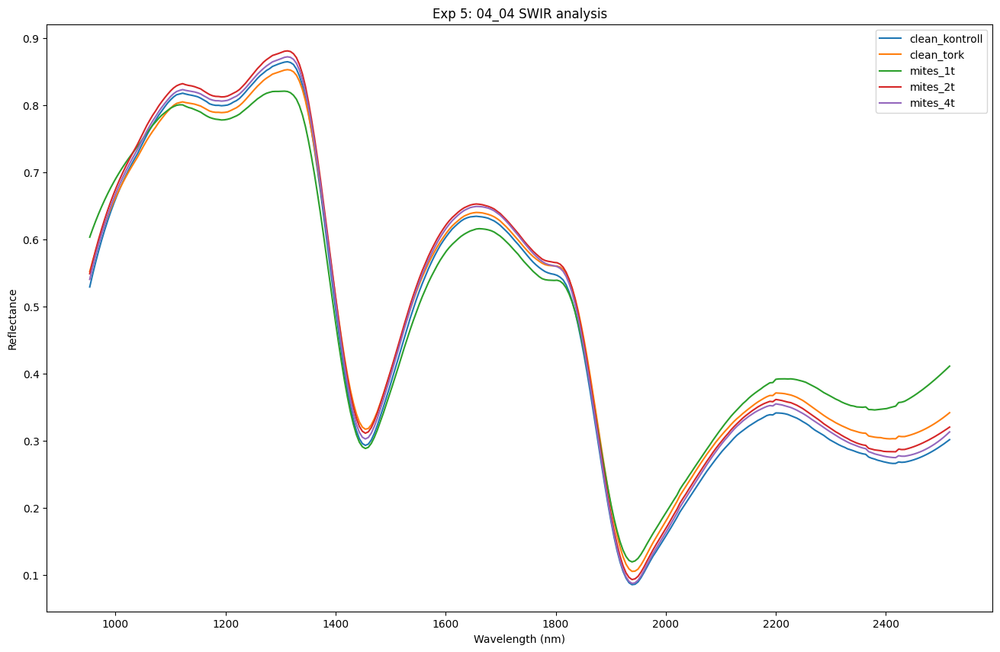

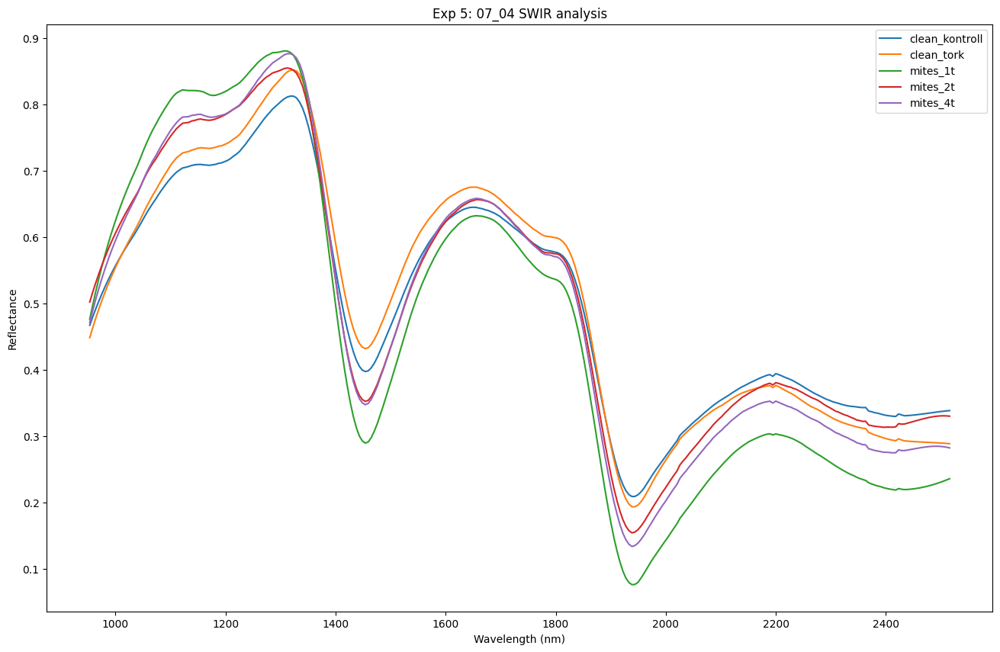

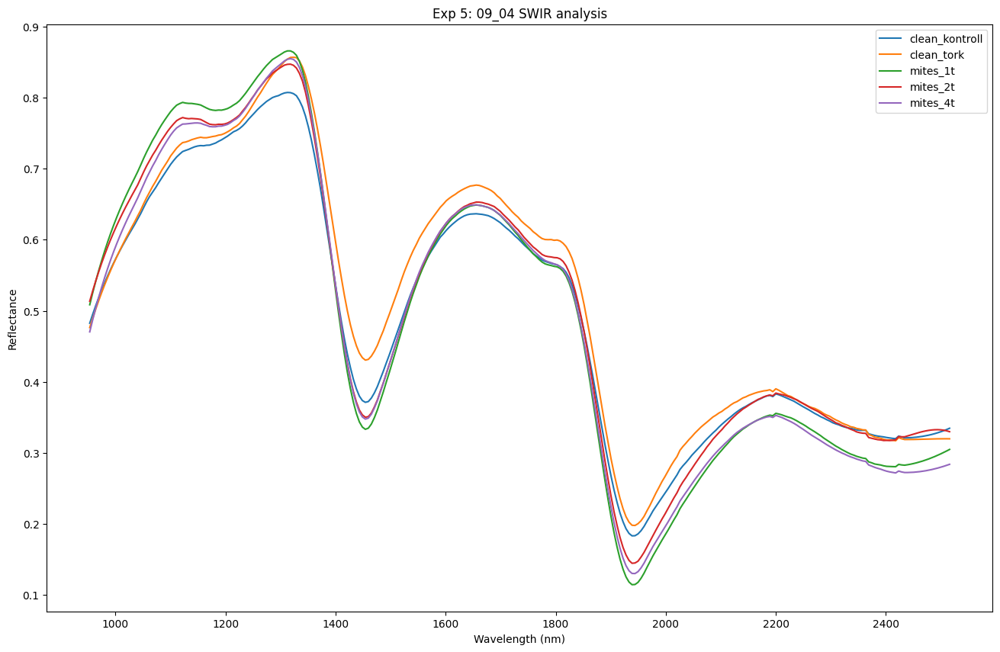

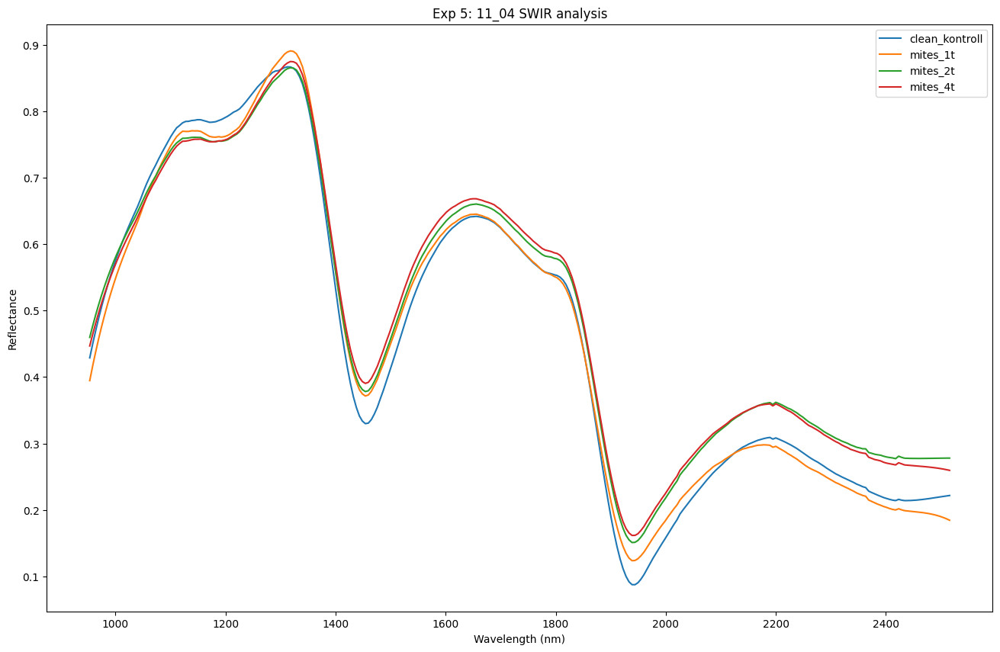

In [26]:
for date, avg in mean_spec_dict["exp5"].items():
   treat_dict = average_by_treatment(avg)
   plt.figure(figsize=(16, 10))
   for t, spec in treat_dict.items():
      # print(f"{t}: {spec.shape} (avg over {len([k for k in mean_spec_dict["310325"] if k.startswith(t)])} samples)")
      plt.plot(ww, spec, label=t)
      plt.legend()
      plt.xlabel("Wavelength (nm)")
      plt.ylabel("Reflectance")
      plt.title(f"Exp 5: {date} SWIR analysis")
      plt.savefig(f"plots/swir_exp5_{date}_minmax.png")

In [31]:
mean_spec_dict

{'exp2': {'21_03': {'clean_kontroll_sample1_SWIR': array([0.47542724, 0.49109763, 0.5061543 , 0.5206314 , 0.5345561 ,
          0.5479586 , 0.5608707 , 0.57332265, 0.5853463 , 0.59696984,
          0.6082235 , 0.61913866, 0.6297502 , 0.64008075, 0.6501684 ,
          0.6600376 , 0.6699116 , 0.68003154, 0.691037  , 0.70163596,
          0.71109086, 0.72091067, 0.7295644 , 0.7385187 , 0.7472631 ,
          0.7547825 , 0.7619962 , 0.7689415 , 0.7746636 , 0.7797651 ,
          0.7825506 , 0.7847678 , 0.7847992 , 0.78523797, 0.7862552 ,
          0.7867467 , 0.7870158 , 0.78683823, 0.7854228 , 0.78429025,
          0.7837782 , 0.7842949 , 0.78464055, 0.7861008 , 0.7879202 ,
          0.7902654 , 0.79287493, 0.7957484 , 0.79916376, 0.80237305,
          0.8062408 , 0.8114515 , 0.81638235, 0.82184964, 0.8275575 ,
          0.83269083, 0.8379914 , 0.8425174 , 0.8469258 , 0.850839  ,
          0.85373396, 0.85683745, 0.8583575 , 0.8597231 , 0.8616748 ,
          0.8632675 , 0.8637836 , 0.862749

## Per imaging day analysis

In [ ]:

def snv(spectrum):
    """Apply Standard Normal Variate (SNV) correction to a single spectrum."""
    spectrum = np.asarray(spectrum, dtype=float)
    mean = np.mean(spectrum)
    std = np.std(spectrum)
    return (spectrum - mean) / std


### day 2

In [65]:
# Save images as per imaging day. 
import json
out_dir = "masked_images_day2"
os.makedirs(out_dir, exist_ok=True)

day2_dict = {"pilot": "21_02", "exp2": "21_03", "exp3": "28_03", "exp4": "28_03", "exp5": "04_04"}
index = []
for exp, exp_dict in masked_dict.items():
    if exp in day2_dict.keys():
            for date, date_dict in exp_dict.items(): 
                if day2_dict[exp] == date:
                    for key, cube in date_dict.items():
                         cube = np.ascontiguousarray(cube.astype(np.float32))
                         path = os.path.join(out_dir, f"{key.lower()}_{exp}_{date}.npy")
                         np.save(path, cube)
                         index.append({"name": key, "path": path, "shape": cube.shape, "dtype": "float32"})

with open(os.path.join(out_dir, "index.json"), "w") as f:
    json.dump(index, f, indent=2)

In [38]:
day2_dict = {"pilot": "21_02", "exp2": "21_03", "exp3": "28_03", "exp4": "28_03", "exp5": "04_04"}
mean_spec_day2 = {}

for exp, exp_dict in mean_spec_dict.items():
    if exp in day2_dict.keys():
            for date, date_dict in exp_dict.items(): 
                if day2_dict[exp] == date:
                    mean_spec_day2[f"{exp}_{date}"] = date_dict
                    
   
mean_spec_day2 = flatten_nested_spectra_dict(mean_spec_day2)

In [44]:
mean_spec_day2.keys()

dict_keys(['clean_kontroll_sample1_SWIR_exp2_21_03', 'clean_kontroll_sample2_SWIR_exp2_21_03', 'clean_tork_sample1_SWIR_exp2_21_03', 'clean_tork_sample2_SWIR_exp2_21_03', 'mites_1t_sample1_SWIR_exp2_21_03', 'mites_1t_sample2_SWIR_exp2_21_03', 'mites_2t_sample1_SWIR_exp2_21_03', 'mites_2t_sample2_SWIR_exp2_21_03', 'mites_4t_sample1_SWIR_exp2_21_03', 'mites_4t_sample2_SWIR_exp2_21_03', 'clean_kontroll_sample1_exp3_and_4_SWIR_exp3_28_03', 'clean_kontroll_sample2_exp3_and_4_SWIR_exp3_28_03', 'clean_tork_sample1_exp3_and_4_SWIR_exp3_28_03', 'clean_tork_sample2_exp3_and_4_SWIR_exp3_28_03', 'mites_1t_sample1_exp3_SWIR_exp3_28_03', 'mites_1t_sample2_exp3_SWIR_exp3_28_03', 'mites_2t_sample1_exp3_SWIR_exp3_28_03', 'mites_2t_sample2_exp3_SWIR_exp3_28_03', 'mites_4t_sample1_exp3_SWIR_exp3_28_03', 'mites_4t_sample2_exp3_SWIR_exp3_28_03', 'clean_kontroll_sample1_exp3_and_4_SWIR_exp4_28_03', 'clean_kontroll_sample2_exp3_and_4_SWIR_exp4_28_03', 'clean_tork_sample1_exp3_and_4_SWIR_exp4_28_03', 'clean_t

In [39]:
del mean_spec_day2["clean_klipp_sample1_SWIR_pilot_21_02"]
del mean_spec_day2["clean_klipp_sample2_SWIR_pilot_21_02"]

In [40]:
# Duplicates since control was for both exp4 and exp3
del mean_spec_day2["clean_kontroll_sample2_exp3_and_4_SWIR_exp4_28_03"]
del mean_spec_day2["clean_kontroll_sample1_exp3_and_4_SWIR_exp4_28_03"]
del mean_spec_day2["clean_tork_sample1_exp3_and_4_SWIR_exp4_28_03"]
del mean_spec_day2["clean_tork_sample2_exp3_and_4_SWIR_exp4_28_03"]

In [41]:
import numpy as np
import pandas as pd
import glob
import os

# Example: all hyperspectral images stored as numpy arrays (height x width x bands)
# and wavelengths stored separately
wavelengths = ww  # shape: (n_bands,)

rows = []
names = []
for key, spec in mean_spec_day2.items():
        rows.append(spec)
        names.append(f"{key.lower()}")

# Create DataFrame with wavelength names as columns
df = pd.DataFrame(rows, columns=[f"{int(w)}nm" for w in wavelengths])
df.insert(0, "image_id", [os.path.basename(f) for f in names])

# (Optional) add labels if available
# df["label"] = ["classA", "classB", ...]

# Save to CSV
df.to_csv("raw_minmax_average_spectra_day2.csv", index=False)
print("✅ Saved average_spectra_day2.csv")


✅ Saved average_spectra_day2.csv


In [16]:
def flatten_nested_spectra_dict(nested_dict):
    """
    Flatten a dict of structure:
        {exp_date: {label: array}}
    into:
        {label_exp_date: array}

    Example:
        {"exp2_21_03": {"clean_kontroll_sample1_SWIR": arr}}
    → 
        {"clean_kontroll_sample1_SWIR_exp2_21_03": arr}
    """
    flat = {}
    for exp_date, inner in nested_dict.items():
        for label, arr in inner.items():
            new_key = f"{label}_{exp_date}"
            flat[new_key] = arr
    return flat


In [69]:
del mean_spec_day2["clean_klipp_sample1_SWIR_pilot_21_02"]
del mean_spec_day2["clean_klipp_sample2_SWIR_pilot_21_02"]

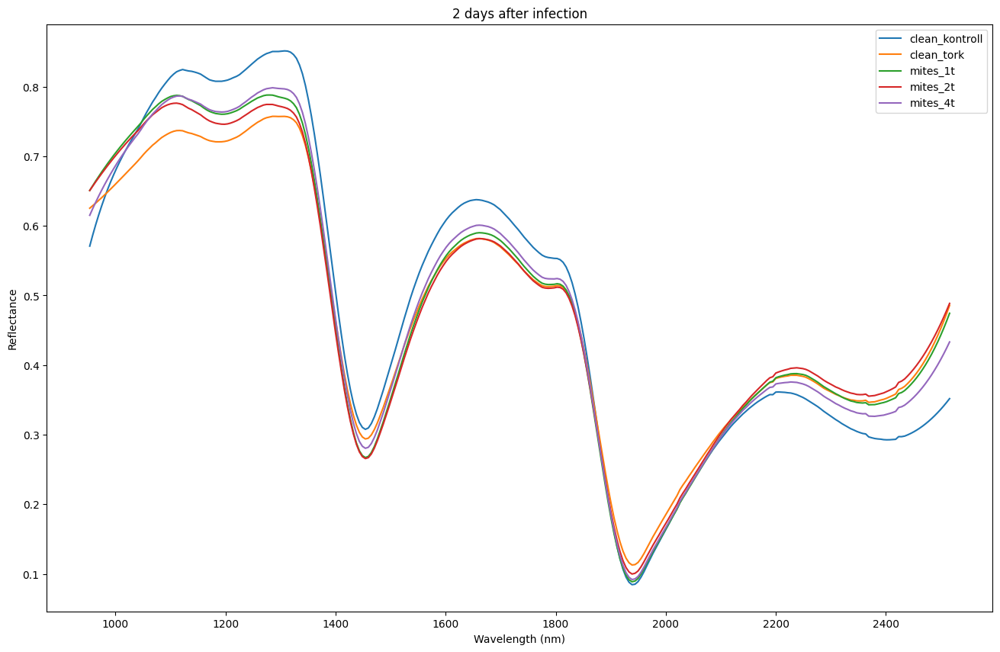

In [72]:

treat_dict = average_by_treatment(mean_spec_day2)
plt.figure(figsize=(16, 10))
for t, spec in treat_dict.items():
   # print(f"{t}: {spec.shape} (avg over {len([k for k in mean_spec_dict["310325"] if k.startswith(t)])} samples)")
   plt.plot(ww, spec, label=t)
   plt.legend()
   plt.xlabel("Wavelength (nm)")
   plt.ylabel("Reflectance")
   plt.title(f"2 days after infection")
   plt.savefig(f"plots/swir_day2_minmax.png")

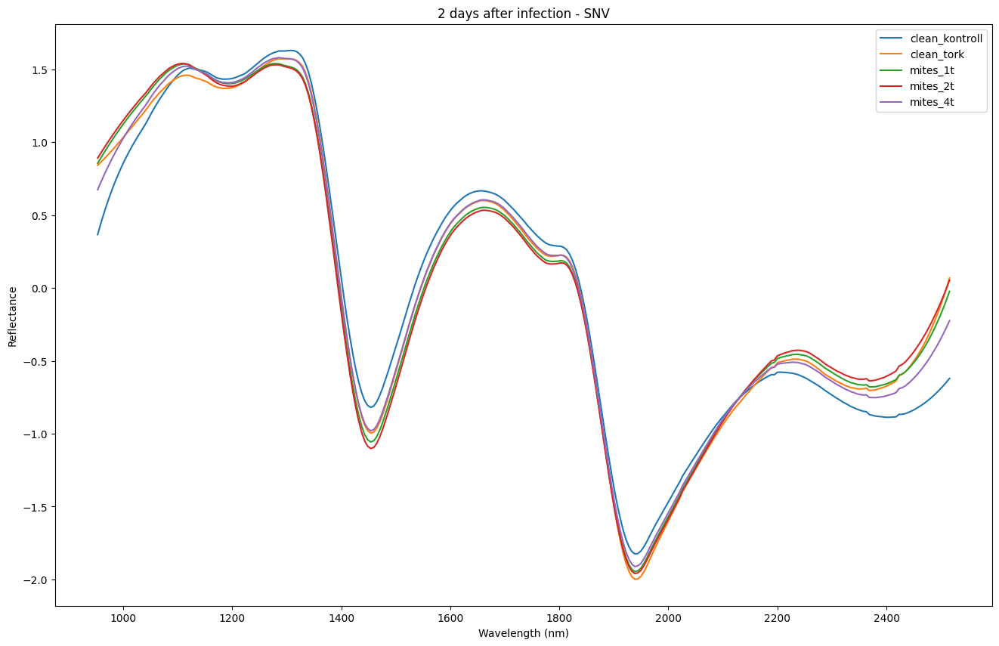

In [135]:
treat_dict = average_by_treatment(mean_spec_day2)
plt.figure(figsize=(16, 10))
for t, spec in treat_dict.items():
   # print(f"{t}: {spec.shape} (avg over {len([k for k in mean_spec_dict["310325"] if k.startswith(t)])} samples)")
   snv_spec = snv(spec)
   plt.plot(ww, snv_spec, label=t)
   plt.legend()
   plt.xlabel("Wavelength (nm)")
   plt.ylabel("Reflectance")
   plt.title(f"2 days after infection - SNV")
   plt.savefig(f"plots/swir_day2_minmax_snv.png")

### Day 5

In [67]:
# Save images as per imaging day. 
import json
out_dir = "masked_images_day5"
os.makedirs(out_dir, exist_ok=True)

day2_dict = {"pilot": "24_02", "exp2": "24_03", "exp3": "31_03", "exp4": "31_03", "exp5": "07_04"}
index = []
for exp, exp_dict in masked_dict.items():
    if exp in day2_dict.keys():
            for date, date_dict in exp_dict.items(): 
                if day2_dict[exp] == date:
                    for key, cube in date_dict.items():
                         cube = np.ascontiguousarray(cube.astype(np.float32))
                         path = os.path.join(out_dir, f"{key.lower()}_{exp}_{date}.npy")
                         np.save(path, cube)
                         index.append({"name": key, "path": path, "shape": cube.shape, "dtype": "float32"})

with open(os.path.join(out_dir, "index.json"), "w") as f:
    json.dump(index, f, indent=2)

In [42]:
day2_dict = {"pilot": "24_02", "exp2": "24_03", "exp3": "31_03", "exp4": "31_03", "exp5": "07_04"}
mean_spec_day3 = {}

for exp, exp_dict in mean_spec_dict.items():
    if exp in day2_dict.keys():
            for date, date_dict in exp_dict.items(): 
                if day2_dict[exp] == date:
                    mean_spec_day3[f"{exp}_{date}"] = date_dict


mean_spec_day3 = flatten_nested_spectra_dict(mean_spec_day3)

In [55]:
mean_spec_day3.keys()

dict_keys(['clean_kontroll_sample1_SWIR_exp2_24_03', 'clean_kontroll_sample2_SWIR_exp2_24_03', 'clean_tork_sample1_SWIR_exp2_24_03', 'clean_tork_sample2_SWIR_exp2_24_03', 'mites_1t_sample1_SWIR_exp2_24_03', 'mites_1t_sample2_SWIR_exp2_24_03', 'mites_2t_sample1_SWIR_exp2_24_03', 'mites_2t_sample2_SWIR_exp2_24_03', 'mites_4t_sample1_SWIR_exp2_24_03', 'mites_4t_sample2_SWIR_exp2_24_03', 'clean_kontroll_sample1_exp3_and_4_SWIR_exp3_31_03', 'clean_kontroll_sample2_exp3_and_4_SWIR_exp3_31_03', 'clean_tork_sample1_exp3_and_4_SWIR_exp3_31_03', 'clean_tork_sample2_exp3_and_4_SWIR_exp3_31_03', 'mites_1t_sample1_exp3_SWIR_exp3_31_03', 'mites_1t_sample2_exp3_SWIR_exp3_31_03', 'mites_2t_sample2_exp3_SWIR_exp3_31_03', 'mites_4t_sample1_exp3_SWIR_exp3_31_03', 'mites_4t_sample2_exp3_SWIR_exp3_31_03', 'mites_1t_sample1_exp4_SWIR_exp4_31_03', 'mites_1t_sample2_exp4_SWIR_exp4_31_03', 'mites_2t_sample1_exp4_SWIR_exp4_31_03', 'mites_2t_sample2_exp4_SWIR_exp4_31_03', 'mites_4t_sample1_exp4_SWIR_exp4_31_03',

In [43]:
del mean_spec_day3["clean_klipp_sample1_SWIR_pilot_24_02"]
del mean_spec_day3["clean_klipp_sample2_SWIR_pilot_24_02"]

In [44]:
# Duplicates since control was for both exp4 and exp3
del mean_spec_day3["clean_kontroll_sample2_exp3_and_4_SWIR_exp4_31_03"]
del mean_spec_day3["clean_kontroll_sample1_exp3_and_4_SWIR_exp4_31_03"]
del mean_spec_day3["clean_tork_sample1_exp3_and_4_SWIR_exp4_31_03"]
del mean_spec_day3["clean_tork_sample2_exp3_and_4_SWIR_exp4_31_03"]

In [45]:
import numpy as np
import pandas as pd
import glob
import os

# Example: all hyperspectral images stored as numpy arrays (height x width x bands)
# and wavelengths stored separately
wavelengths = ww  # shape: (n_bands,)

rows = []
names = []
for key, avg_spectrum in mean_spec_day3.items():
    rows.append(avg_spectrum)
    names.append(f"{key.lower()}")

# Create DataFrame with wavelength names as columns
df = pd.DataFrame(rows, columns=[f"{int(w)}nm" for w in wavelengths])
df.insert(0, "image_id", [os.path.basename(f) for f in names])

# (Optional) add labels if available
# df["label"] = ["classA", "classB", ...]

# Save to CSV
df.to_csv("raw_minmax_average_spectra_day5.csv", index=False)
print("✅ Saved average_spectra_day5.csv")

✅ Saved average_spectra_day5.csv


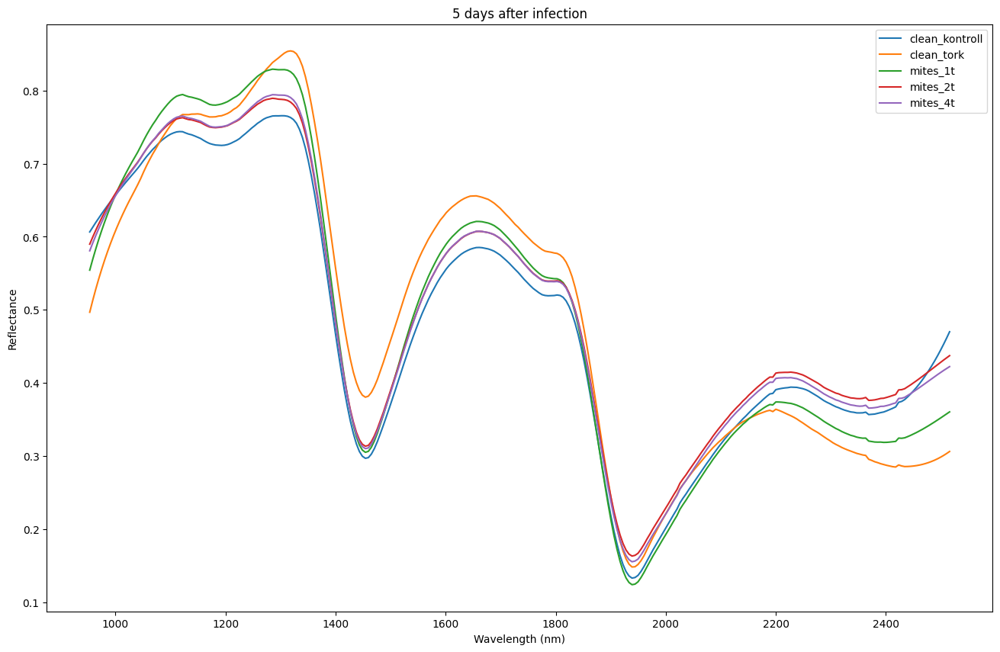

In [123]:
treat_dict = average_by_treatment(mean_spec_day3)
plt.figure(figsize=(16, 10))
for t, spec in treat_dict.items():
   # print(f"{t}: {spec.shape} (avg over {len([k for k in mean_spec_dict["310325"] if k.startswith(t)])} samples)")
   plt.plot(ww, spec, label=t)
   plt.legend()
   plt.xlabel("Wavelength (nm)")
   plt.ylabel("Reflectance")
   plt.title(f"5 days after infection")
   plt.savefig(f"plots/swir_day5_minmax.png")

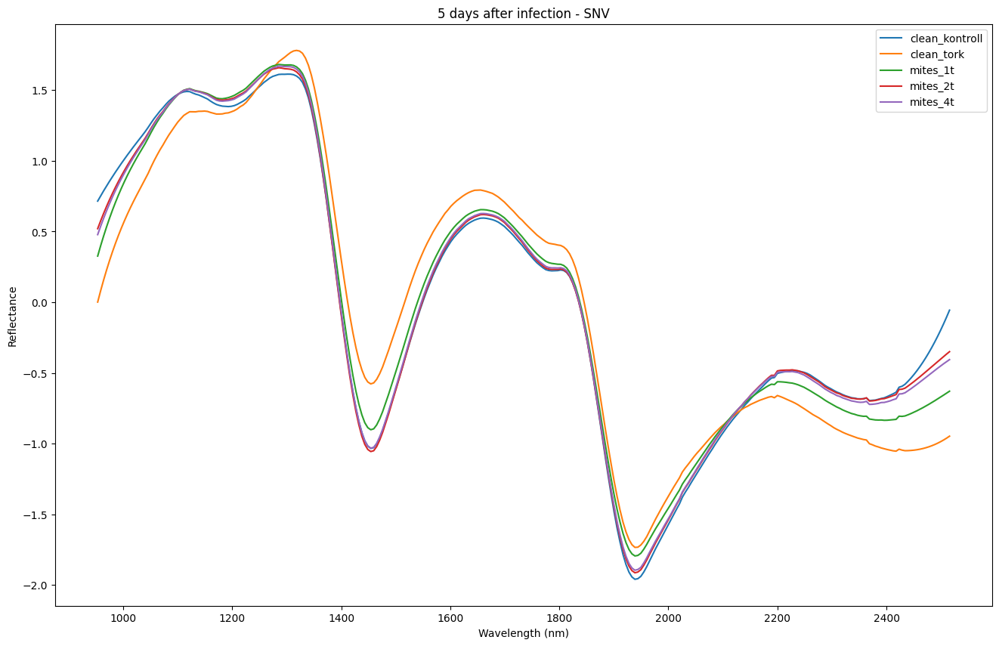

In [134]:
treat_dict = average_by_treatment(mean_spec_day3)
plt.figure(figsize=(16, 10))
for t, spec in treat_dict.items():
   # print(f"{t}: {spec.shape} (avg over {len([k for k in mean_spec_dict["310325"] if k.startswith(t)])} samples)")
   snv_spec = snv(spec)
   plt.plot(ww, snv_spec, label=t)
   plt.legend()
   plt.xlabel("Wavelength (nm)")
   plt.ylabel("Reflectance")
   plt.title(f"5 days after infection - SNV")
   plt.savefig(f"plots/swir_day5_minmax_snv.png")

### Day 7 

In [46]:
day7_dict = {"pilot": "26_02", "exp2": "26_03", "exp3": "02_04", "exp4": "02_04", "exp5": "09_04"}
mean_spec_day7 = {}

for exp, exp_dict in mean_spec_dict.items():
    if exp in day7_dict.keys():
            for date, date_dict in exp_dict.items(): 
                if day7_dict[exp] == date:
                    mean_spec_day7[f"{exp}_{date}"] = date_dict


mean_spec_day7 = flatten_nested_spectra_dict(mean_spec_day7)

In [64]:
# Save images as per imaging day. 
import json
out_dir = "masked_images_day7"
os.makedirs(out_dir, exist_ok=True)

day2_dict = {"pilot": "26_02", "exp2": "26_03", "exp3": "02_04", "exp4": "02_04", "exp5": "09_04"}
index = []
for exp, exp_dict in masked_dict.items():
    if exp in day2_dict.keys():
            for date, date_dict in exp_dict.items(): 
                if day2_dict[exp] == date:
                    for key, cube in date_dict.items():
                         cube = np.ascontiguousarray(cube.astype(np.float32))
                         path = os.path.join(out_dir, f"{key.lower()}_{exp}_{date}.npy")
                         np.save(path, cube)
                         index.append({"name": key, "path": path, "shape": cube.shape, "dtype": "float32"})

with open(os.path.join(out_dir, "index.json"), "w") as f:
    json.dump(index, f, indent=2)

In [ ]:
for key in mean_spec_day7.keys():
    print(key)

clean_kontroll_sample1_SWIR_exp2_26_03
clean_kontroll_sample2_SWIR_exp2_26_03
clean_tork_sample1_SWIR_exp2_26_03
clean_tork_sample2_SWIR_exp2_26_03
mites_1t_sample1_SWIR_exp2_26_03
mites_1t_sample2_SWIR_exp2_26_03
mites_2t_sample1_SWIR_exp2_26_03
mites_2t_sample2_SWIR_exp2_26_03
mites_4t_sample1_SWIR_exp2_26_03
mites_4t_sample2_SWIR_exp2_26_03
clean_kontroll_sample1_exp3_and_4_SWIR_exp3_02_04
clean_kontroll_sample2_exp3_and_4_SWIR_exp3_02_04
clean_tork_kontroll_sample1_exp3_and_4_SWIR_exp3_02_04
clean_tork_kontroll_sample2_exp3_and_4_SWIR_exp3_02_04
mites_1t_sample1_exp3_SWIR_exp3_02_04
mites_1t_sample2_exp3_SWIR_exp3_02_04
mites_2t_sample1_exp3_SWIR_exp3_02_04
mites_2t_sample2_exp3_SWIR_exp3_02_04
mites_4t_sample1_exp3_SWIR_exp3_02_04
mites_4t_sample2_exp3_SWIR_exp3_02_04
clean_kontroll_sample1_exp3_and_4_SWIR_exp4_02_04
clean_kontroll_sample2_exp3_and_4_SWIR_exp4_02_04
clean_tork_kontroll_sample1_exp3_and_4_SWIR_exp4_02_04
clean_tork_kontroll_sample2_exp3_and_4_SWIR_exp4_02_04
mites_

In [47]:
# Duplicates since control was for both exp4 and exp3
del mean_spec_day7["clean_tork_kontroll_sample2_exp3_and_4_SWIR_exp4_02_04"]
del mean_spec_day7["clean_tork_kontroll_sample1_exp3_and_4_SWIR_exp4_02_04"]
del mean_spec_day7["clean_kontroll_sample2_exp3_and_4_SWIR_exp4_02_04"]
del mean_spec_day7["clean_kontroll_sample1_exp3_and_4_SWIR_exp4_02_04"]


In [54]:
# delete since only part of pilot
del mean_spec_day7["Clean_klipp_sample1_SWIR_pilot_26_02"]
del mean_spec_day7["Clean_klipp_sample2_SWIR_pilot_26_02"]

KeyError: 'Clean_klipp_sample1_SWIR_pilot_26_02'

In [34]:
# Duplicates since control was for both exp4 and exp3
del mean_spec_day7["exp4_02_04"]["clean_tork_kontroll_sample2_exp3_and_4_SWIR"]
del mean_spec_day7["exp4_02_04"]["clean_tork_kontroll_sample1_exp3_and_4_SWIR"]
del mean_spec_day7["exp4_02_04"]["clean_kontroll_sample2_exp3_and_4_SWIR"]
del mean_spec_day7["exp4_02_04"]["clean_kontroll_sample1_exp3_and_4_SWIR"]

In [36]:
# delete since only part of pilot
del mean_spec_day7["pilot_26_02"]["Clean_klipp_sample1_SWIR"]
del mean_spec_day7["pilot_26_02"]["Clean_klipp_sample2_SWIR"]

In [37]:
#del mean_spec_day7["Clean_klipp_sample2_SWIR_pilot_26_02"]
mean_spec_day7["clean_tork_sample1_exp3_and_4_SWIR_exp3_02_04"] = mean_spec_day7.pop("clean_tork_kontroll_sample1_exp3_and_4_SWIR_exp3_02_04")
mean_spec_day7["clean_tork_sample2_exp3_and_4_SWIR_exp3_02_04"] = mean_spec_day7.pop("clean_tork_kontroll_sample2_exp3_and_4_SWIR_exp3_02_04")


KeyError: 'clean_tork_kontroll_sample1_exp3_and_4_SWIR_exp3_02_04'

In [38]:
mean_spec_day7["exp3_02_04"]["clean_tork_sample1_exp3_and_4_SWIR"] = mean_spec_day7["exp3_02_04"].pop("clean_tork_kontroll_sample1_exp3_and_4_SWIR")
mean_spec_day7["exp3_02_04"]["clean_tork_sample2_exp3_and_4_SWIR"] = mean_spec_day7["exp3_02_04"].pop("clean_tork_kontroll_sample2_exp3_and_4_SWIR")


In [53]:
import numpy as np
import pandas as pd
import glob
import os

# Example: all hyperspectral images stored as numpy arrays (height x width x bands)
# and wavelengths stored separately
wavelengths = ww  # shape: (n_bands,)

rows = []
names = []

for key, avg_spectrum in mean_spec_day7.items():
    rows.append(avg_spectrum)
    names.append(f"{key.lower()}")

# Create DataFrame with wavelength names as columns
df = pd.DataFrame(rows, columns=[f"{int(w)}nm" for w in wavelengths])
df.insert(0, "image_id", [os.path.basename(f.lower()) for f in names])

# (Optional) add labels if available
# df["label"] = ["classA", "classB", ...]

# Save to CSV
df.to_csv("raw_minmax_average_spectra_day7.csv", index=False)
print("✅ Saved average_spectra_day7.csv")

✅ Saved average_spectra_day7.csv


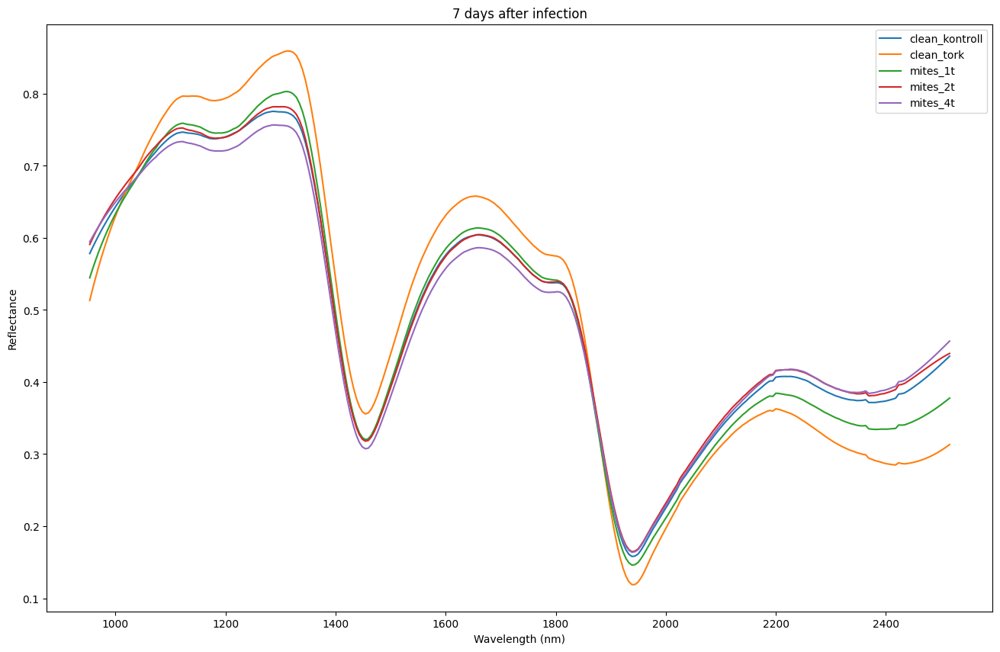

In [ ]:
treat_dict = average_by_treatment(mean_spec_day7)
plt.figure(figsize=(16, 10))
for t, spec in treat_dict.items():
   # print(f"{t}: {spec.shape} (avg over {len([k for k in mean_spec_dict["310325"] if k.startswith(t)])} samples)")
   plt.plot(ww, spec, label=t)
   plt.legend()
   plt.xlabel("Wavelength (nm)")
   plt.ylabel("Reflectance")
   plt.title(f"7 days after infection")
   plt.savefig(f"plots/swir_day7_minmax.png")
   

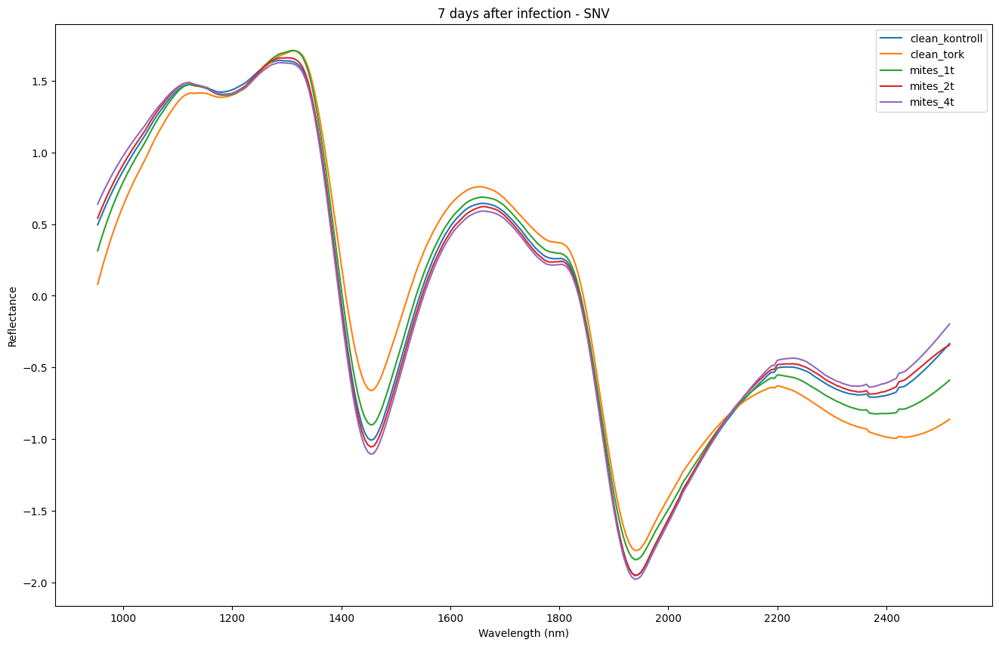

In [136]:
treat_dict = average_by_treatment(mean_spec_day7)
plt.figure(figsize=(16, 10))
for t, spec in treat_dict.items():
   # print(f"{t}: {spec.shape} (avg over {len([k for k in mean_spec_dict["310325"] if k.startswith(t)])} samples)")
   snv_spec = snv(spec)
   plt.plot(ww, snv_spec, label=t)
   plt.legend()
   plt.xlabel("Wavelength (nm)")
   plt.ylabel("Reflectance")
   plt.title(f"7 days after infection - SNV")
   plt.savefig(f"plots/swir_day7_minmax_snv.png")

### Day 9 

In [70]:
# Save images as per imaging day. 
import json
out_dir = "masked_images_day9"
os.makedirs(out_dir, exist_ok=True)

day2_dict = {"pilot": "28_02", "exp2": "28_03", "exp3": "04_04", "exp4": "04_04", "exp5": "11_04"}
index = []
for exp, exp_dict in masked_dict.items():
    if exp in day2_dict.keys():
            for date, date_dict in exp_dict.items(): 
                if day2_dict[exp] == date:
                    for key, cube in date_dict.items():
                         cube = np.ascontiguousarray(cube.astype(np.float32))
                         path = os.path.join(out_dir, f"{key.lower()}_{exp}_{date}.npy")
                         np.save(path, cube)
                         index.append({"name": key, "path": path, "shape": cube.shape, "dtype": "float32"})

with open(os.path.join(out_dir, "index.json"), "w") as f:
    json.dump(index, f, indent=2)

In [55]:
day_dict = {"pilot": "28_02", "exp2": "28_03", "exp3": "04_04", "exp4": "04_04", "exp5": "11_04"}
mean_spec_day9 = {}

for exp, exp_dict in mean_spec_dict.items():
    if exp in day_dict.keys():
            for date, date_dict in exp_dict.items(): 
                if day_dict[exp] == date:
                    mean_spec_day9[f"{exp}_{date}"] = date_dict


mean_spec_day9 = flatten_nested_spectra_dict(mean_spec_day9)

In [56]:
# Duplicates since control was for both exp4 and exp3
del mean_spec_day9["clean_tork_sample2_exp3_and_4_SWIR_exp4_04_04"]
del mean_spec_day9["clean_tork_sample1_exp3_and_4_SWIR_exp4_04_04"]
del mean_spec_day9["clean_kontroll_sample2_exp3_and_4_SWIR_exp4_04_04"]
del mean_spec_day9["clean_kontroll_sample1_exp3_and_4_SWIR_exp4_04_04"]

In [57]:
import numpy as np
import pandas as pd
import glob
import os

# Example: all hyperspectral images stored as numpy arrays (height x width x bands)
# and wavelengths stored separately
wavelengths = ww  # shape: (n_bands,)

rows = []
names = []

for key, avg_spectrum in mean_spec_day9.items():
    rows.append(avg_spectrum)
    names.append(f"{key.lower()}")

# Create DataFrame with wavelength names as columns
df = pd.DataFrame(rows, columns=[f"{int(w)}nm" for w in wavelengths])
df.insert(0, "image_id", [os.path.basename(f) for f in names])

# (Optional) add labels if available
# df["label"] = ["classA", "classB", ...]

# Save to CSV
df.to_csv("raw_minmax_average_spectra_day9.csv", index=False)
print("✅ Saved average_spectra_day9.csv")

✅ Saved average_spectra_day9.csv


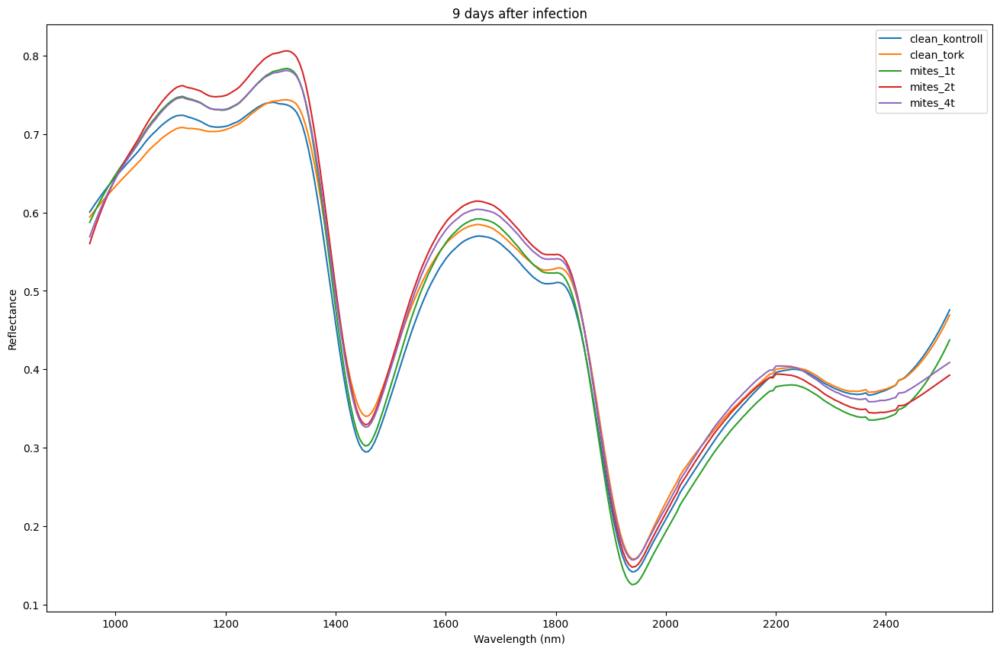

In [131]:
treat_dict = average_by_treatment(mean_spec_day9)
plt.figure(figsize=(16, 10))
for t, spec in treat_dict.items():
   # print(f"{t}: {spec.shape} (avg over {len([k for k in mean_spec_dict["310325"] if k.startswith(t)])} samples)")
   plt.plot(ww, spec, label=t)
   plt.legend()
   plt.xlabel("Wavelength (nm)")
   plt.ylabel("Reflectance")
   plt.title(f"9 days after infection")
   plt.savefig(f"plots/swir_day9_minmax.png")

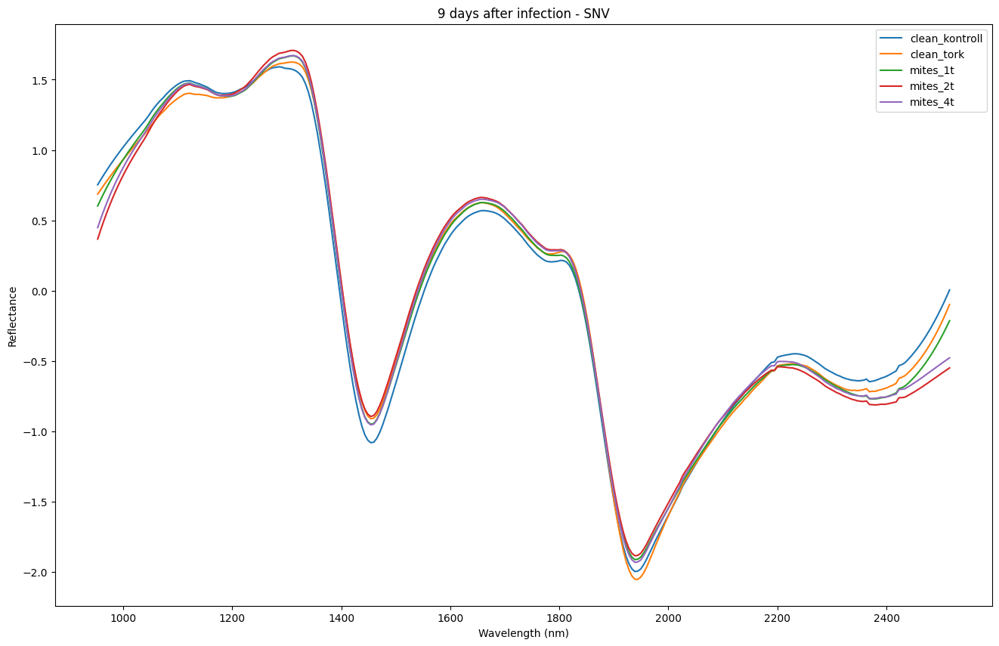

In [137]:
treat_dict = average_by_treatment(mean_spec_day9)
plt.figure(figsize=(16, 10))
for t, spec in treat_dict.items():
   # print(f"{t}: {spec.shape} (avg over {len([k for k in mean_spec_dict["310325"] if k.startswith(t)])} samples)")
   snv_spec = snv(spec)
   plt.plot(ww, snv_spec, label=t)
   plt.legend()
   plt.xlabel("Wavelength (nm)")
   plt.ylabel("Reflectance")
   plt.title(f"9 days after infection - SNV")
   plt.savefig(f"plots/swir_day9_minmax_snv.png")